## **1. Import packages**

In [ ]:
# !set CUDA_VISIBLE_DEVICES=""

In [ ]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
from torchvision.io import read_image
import numpy as np
from PIL import Image, ImageOps

# Generation imports
import librosa
import librosa.display
import os
from numpy.fft import *
import matplotlib.pyplot as plt
import math
import wave
import struct
from scipy.io import wavfile

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

## **0. Generate Dataset**

In [ ]:
# Dataset generation and loading helpers
# Should implement batching

def lerp(img, min=0, max=1):
    img_std = (img - img.min()) / (img.max() - img.min())
    return img_std * (max - min) + min


# Stolen from https://dsp.stackexchange.com/questions/72027/python-audio-analysis-which-spectrogram-should-i-use-and-why
# No idea if this is at all decent but works better than scipy.signal.spectrogram on random files i got
def generate_spectrogram(in_path, out_path):
    x, sr = librosa.load(in_path, sr=None)
    window_size = 1024
    hop_length = 512
    n_mels = 128
    time_steps = 384
    window = np.hanning(window_size)
    stft = librosa.core.spectrum.stft(x, n_fft = window_size, hop_length = hop_length, window = window)
    out = 2 * np.abs(stft) / np.sum(window)

    # data = librosa.amplitude_to_db(out, ref=np.max)
    # data = np.log(data + 1e-9)

    # plt.imsave(out_path + ".png", data, cmap='hot')

#     fig = plt.figure(figsize = (12,4))
#     librosa.display.specshow(librosa.amplitude_to_db(out, ref=np.max), y_axis='log', x_axis='time', sr=sr)
#     plt.axis('off')
#     plt.set_cmap('hot')
#     plt.savefig(out_path, bbox_inches = 'tight', transparent = True, pad_inches = 0.0)
#     plt.clf()
#     plt.close(fig)

# Creates spectrogram dataset from two identically indexed directories of wav files
def create_spectrogram_dataset(x_dir, y_dir, target_dir):
    for (file_x, file_y) in zip(os.listdir(x_dir), os.listdir(y_dir)):
        file_name = file_x.split(".")[0]
        file_dir = os.path.join(target_dir, file_name)
        if not os.path.isdir(file_dir):
            os.mkdir(file_dir)
        generate_spectrogram(os.path.join(x_dir, file_x), os.path.join(file_dir, file_name + "_x"))
        generate_spectrogram(os.path.join(y_dir, file_y), os.path.join(file_dir, file_name + "_y"))
        print("Generated ", file_name, "...")

In [ ]:
def imshow(img):
    npimg = img.numpy()
    # npimg = (npimg * 255).transpose(1,2,0).astype(np.uint8)
    plt.figure(figsize = (20,20))
    plt.imshow(img.permute(1,2,0), interpolation='nearest')
    plt.show()

# Split is tensor of shape [t, c, h, w]
def stitch(split):
    return torch.cat(list(map(lambda t : t[0,:,:], torch.tensor_split(split, split.shape[0]))), dim=2)

## **2. Dataset**

In [ ]:
class SpectrogramDataset(data.Dataset):
    def __init__(self, root, train, num_splits=None, crop_size=None):
        super(SpectrogramDataset, self).__init__()

        self.root = root
        self.num_splits = num_splits
        self.split_spectrograms = {}
        self.crop_size = crop_size

    def __len__(self):
        return len(os.listdir(self.root))

    def __getitem__(self, i):
        if self.num_splits:
            i_name = sorted(os.listdir(self.root))[i]
            i_path = os.path.join(self.root, i_name)
            [x_path, y_path] = map(lambda path : os.path.join(i_path, path), sorted(os.listdir(i_path)))
            x = read_image(x_path, mode=torchvision.io.ImageReadMode.RGB).float() / 255.0 # Read image and normalize
            y = read_image(y_path, mode=torchvision.io.ImageReadMode.RGB).float() / 255.0
            
            if self.crop_size:
                x = x[:,:self.crop_size[0],:crop_size[1]]
                y = y[:,:self.crop_size[0],:crop_size[1]]
                
            x_split = torch.stack(torch.chunk(x, self.num_splits, dim=2), 0) # Returns stack of tensors with shape [3, h, w/self.num_split]
            y_split = torch.stack(torch.chunk(y, self.num_splits, dim=2), 0)

            return x_split, y_split
        else:
            i_name = sorted(os.listdir(self.root))[i]
            i_path = os.path.join(self.root, i_name)
            [x_path, y_path] = map(lambda path : os.path.join(i_path, path), sorted(os.listdir(i_path)))
            x = read_image(x_path, mode=torchvision.io.ImageReadMode.RGB).float() / 255.0
            y = read_image(y_path, mode=torchvision.io.ImageReadMode.RGB).float() / 255.0
            
            if self.crop_size:
                x = x[:,:self.crop_size[0],:crop_size[1]]
                y = y[:,:self.crop_size[0],:crop_size[1]]
                
            return x, y

## **3. Network**

In [ ]:
class Model(nn.Module):
    def __init__(self, img_size, hidden_dim, latent_size, batch_size):
        super(Model, self).__init__()
        self.hidden_dim = hidden_dim
        self.img_size = img_size
        
        self.encoder_conv1 = nn.Conv2d(3, hidden_dim, 5, padding=2)
        self.encoder_conv2 = nn.Conv2d(hidden_dim, hidden_dim, 5, padding=2)
        self.encoder_linear = nn.Linear(batch_size * hidden_dim * img_size[0] * img_size[1], latent_size + latent_size)
        
        self.decoder_linear = nn.Linear(latent_size, batch_size * hidden_dim * img_size[0] * img_size[1])
        self.decoder_conv1 = nn.Conv2d(hidden_dim, hidden_dim, 5, padding=2)
        self.decoder_conv2 = nn.Conv2d(hidden_dim, 3, 5, padding=2)
        
        self.debug = True
        
    def forward(self, x):
#         print(x.shape)
        b, _, h, w = x.size()
        ec1 = F.relu(self.encoder_conv1(x)).cuda()
        ec2 = F.relu(self.encoder_conv2(ec1)).cuda()
        el = self.encoder_linear(ec2.view(b * self.hidden_dim * h * w)).cuda()
        # ec1 = F.relu(self.encoder_conv1(x))
        # ec2 = F.relu(self.encoder_conv2(ec1))
        # el = self.encoder_linear(ec2.view(b * self.hidden_dim * h * w))
        
        mean, logvar = torch.chunk(el, 2)
        
        eps = torch.randn_like(mean, device=torch.device('cuda'))
        # eps = torch.randn_like(mean, device=device)

        std = torch.exp(logvar * 0.5)
            
        sample = (mean + std * eps).cuda()
        # sample = (mean + std * eps)
        
        dl = F.relu(self.decoder_linear(sample))
        dc1 = F.relu(self.decoder_conv1(dl.view(b, self.hidden_dim, h, w)))
        dc2 = torch.sigmoid(self.decoder_conv2(dc1))
        
        if torch.sum(torch.isnan(dc2)) > 0:
            print("Warning: prediction contains nan values. Traceback:")
            print("mean", mean)
            print("logvar", logvar)
            print("eps", eps)
            print("std", std)
            print("sample", sample)
        
        return mean, logvar, dc2

## **5. Training**

In [ ]:
train_set = SpectrogramDataset('spectrogram_dataset/train', True, None)
test_set = SpectrogramDataset('spectrogram_dataset/test', False, None)

# train_set = SpectrogramDataset('spectrogram_3', True, None)
# test_set = SpectrogramDataset('spectrogram_3', True, None)

batch_size = 5

train_loader = torch.utils.data.DataLoader(
                dataset=train_set,
                batch_size=batch_size,
                shuffle=True)

test_loader = torch.utils.data.DataLoader(
                dataset=test_set,
                batch_size=batch_size,
                shuffle=False)



In [ ]:
# Compute loss
def compute_loss(y, y_hat, mean, log_var):
#     return nn.MSELoss()(y_hat, y)
    if torch.max(y_hat) > 1.0 or torch.min(y_hat) < 0.0:
        print("Warning: y_hat max of", torch.max(y_hat), "and y_hat min of", torch.min(y_hat))
    if torch.sum(torch.isnan(y_hat)) > 0:
        print("Warning: y_hat contains", torch.sum(torch.isnan(y_hat)), "nan values")
        
    if torch.max(y) > 1.0 or torch.min(y) < 0.0:
        print("Warning: y max of", torch.max(y), "and y min of", torch.min(y))
    if torch.sum(torch.isnan(y)) > 0:
        print("Warning: y contains", torch.sum(torch.isnan(y)), "nan values")
        
    kl_divergence = 0.5 * torch.sum(-1 - log_var + mean.pow(2) + logvar.exp())
    return F.binary_cross_entropy(y_hat, y, reduction='sum') + kl_divergence

# Evaluate network
def evaluate(net, data_loader):
    net.eval()
    
    Loss = 0
    count = 0
    with torch.no_grad():
        for i, batch in enumerate(data_loader):
            x, y = batch[0].to(device), batch[1].to(device)
            mean, logvar, y_hat = net.forward(x)
            
            loss = compute_loss(y, y_hat, mean, logvar)
            
            Loss += loss.item()
            count += 1
            
        avg_loss = Loss / count
        
    return avg_loss

Training start!


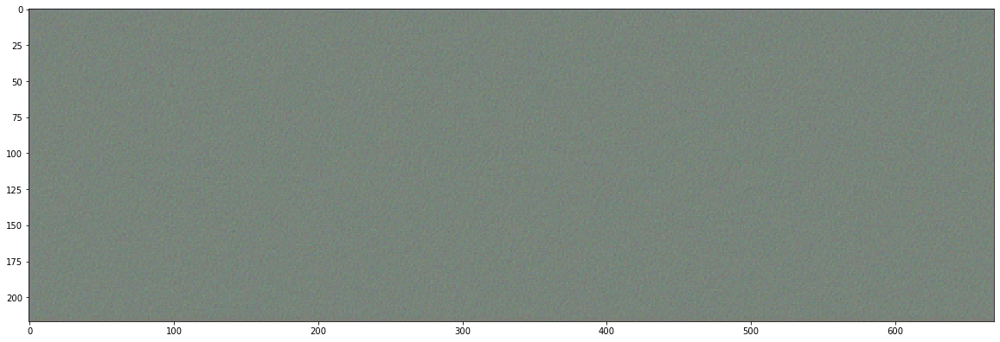

Epoch: [1/100], Step: [0], learning_rate: 0.001, loss: 1523077.125000
Epoch: [1/100], Step: [5], learning_rate: 0.001, loss: 1100680.625000
Epoch: [1/100], Step: [10], learning_rate: 0.001, loss: 954843.375000
Epoch: [1/100], Step: [15], learning_rate: 0.001, loss: 904942.937500
Avg loss on test dataset: 899153.8229166666


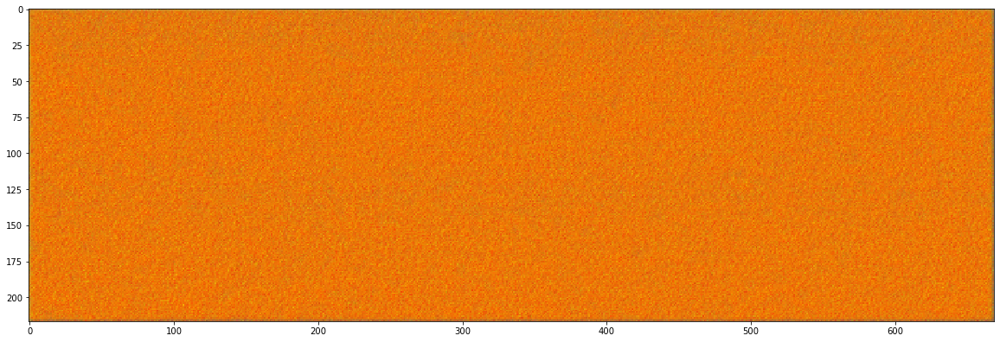

Epoch: [2/100], Step: [0], learning_rate: 0.001, loss: 891079.875000
Epoch: [2/100], Step: [5], learning_rate: 0.001, loss: 881537.437500
Epoch: [2/100], Step: [10], learning_rate: 0.001, loss: 875743.562500
Epoch: [2/100], Step: [15], learning_rate: 0.001, loss: 865905.062500
Avg loss on test dataset: 873432.0625


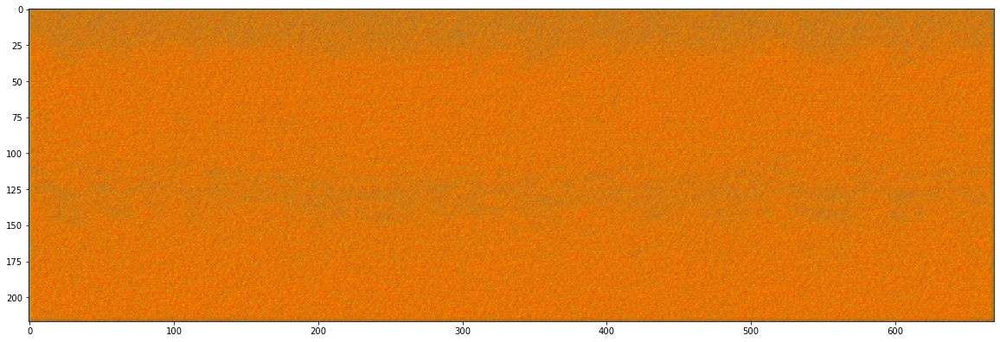

Epoch: [3/100], Step: [0], learning_rate: 0.001, loss: 868224.500000
Epoch: [3/100], Step: [5], learning_rate: 0.001, loss: 860514.750000
Epoch: [3/100], Step: [10], learning_rate: 0.001, loss: 855037.562500
Epoch: [3/100], Step: [15], learning_rate: 0.001, loss: 854672.062500
Avg loss on test dataset: 862189.3229166666


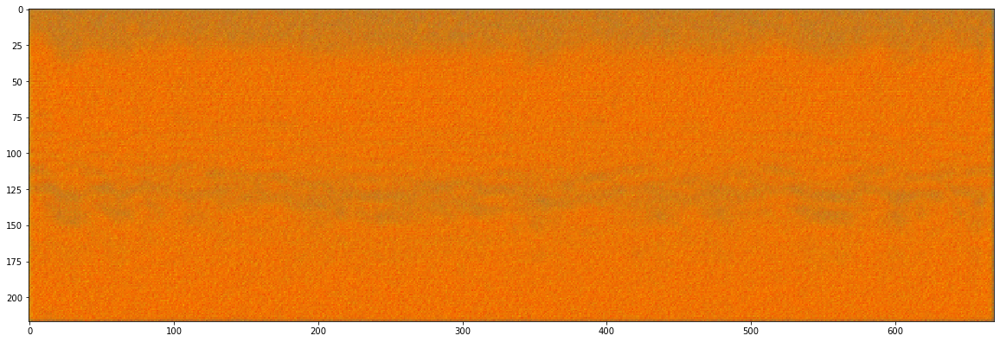

Epoch: [4/100], Step: [0], learning_rate: 0.001, loss: 845409.562500
Epoch: [4/100], Step: [5], learning_rate: 0.001, loss: 842365.000000
Epoch: [4/100], Step: [10], learning_rate: 0.001, loss: 837558.500000
Epoch: [4/100], Step: [15], learning_rate: 0.001, loss: 835962.687500
Avg loss on test dataset: 849605.8333333334


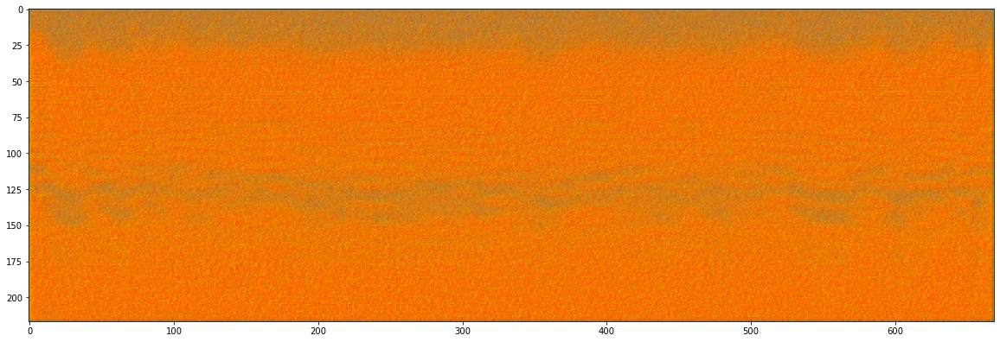

Epoch: [5/100], Step: [0], learning_rate: 0.001, loss: 828630.812500
Epoch: [5/100], Step: [5], learning_rate: 0.001, loss: 827410.875000
Epoch: [5/100], Step: [10], learning_rate: 0.001, loss: 826301.375000
Epoch: [5/100], Step: [15], learning_rate: 0.001, loss: 827766.812500
Avg loss on test dataset: 841735.6354166666


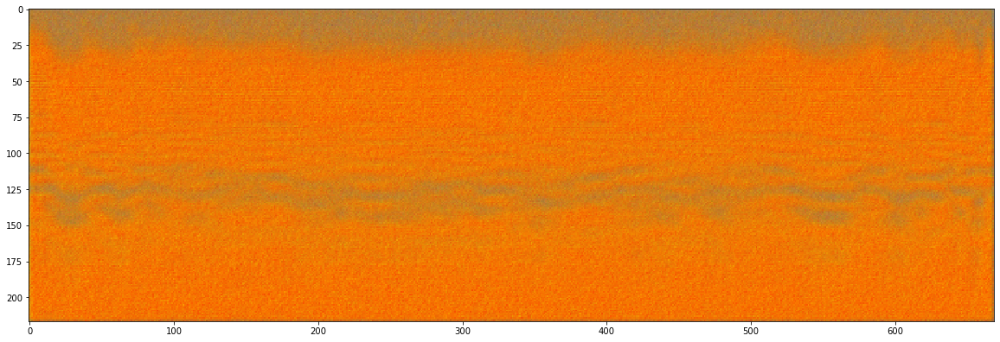

Epoch: [6/100], Step: [0], learning_rate: 0.001, loss: 818777.312500
Epoch: [6/100], Step: [5], learning_rate: 0.001, loss: 817333.562500
Epoch: [6/100], Step: [10], learning_rate: 0.001, loss: 815706.375000
Epoch: [6/100], Step: [15], learning_rate: 0.001, loss: 813899.500000
Avg loss on test dataset: 830601.6666666666


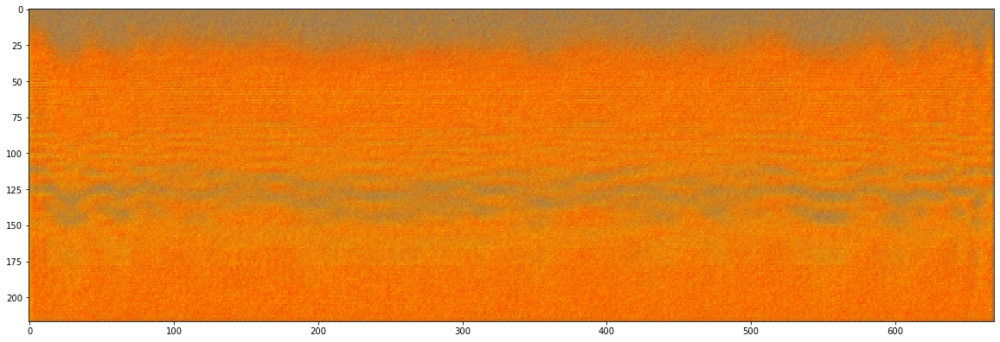

Epoch: [7/100], Step: [0], learning_rate: 0.001, loss: 811425.000000
Epoch: [7/100], Step: [5], learning_rate: 0.001, loss: 803127.625000
Epoch: [7/100], Step: [10], learning_rate: 0.001, loss: 793706.562500
Epoch: [7/100], Step: [15], learning_rate: 0.001, loss: 790040.500000
Avg loss on test dataset: 814474.46875


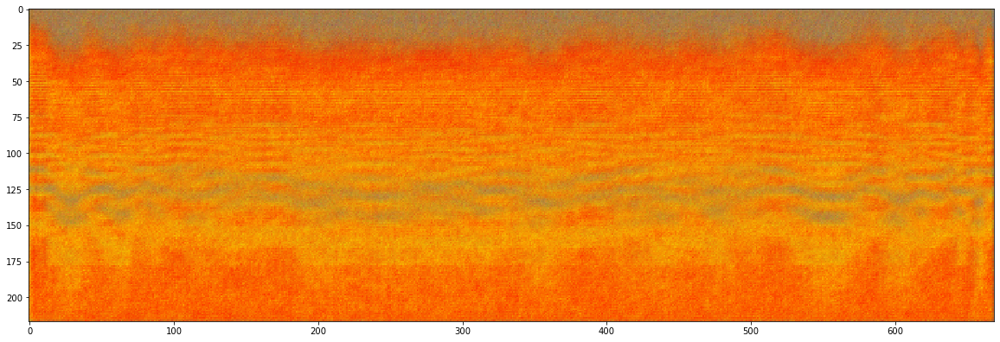

Epoch: [8/100], Step: [0], learning_rate: 0.001, loss: 776027.000000
Epoch: [8/100], Step: [5], learning_rate: 0.001, loss: 774629.562500
Epoch: [8/100], Step: [10], learning_rate: 0.001, loss: 760798.250000
Epoch: [8/100], Step: [15], learning_rate: 0.001, loss: 743016.312500
Avg loss on test dataset: 770472.4895833334


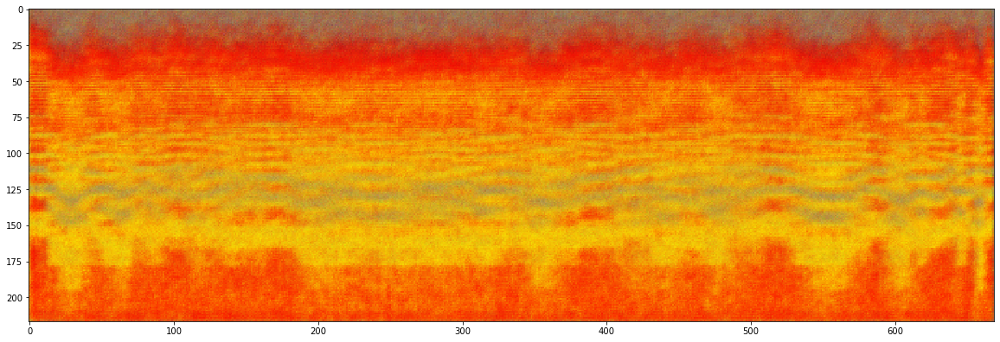

Epoch: [9/100], Step: [0], learning_rate: 0.001, loss: 732058.625000
Epoch: [9/100], Step: [5], learning_rate: 0.001, loss: 715508.312500
Epoch: [9/100], Step: [10], learning_rate: 0.001, loss: 704261.937500
Epoch: [9/100], Step: [15], learning_rate: 0.001, loss: 689120.312500
Avg loss on test dataset: 728556.25


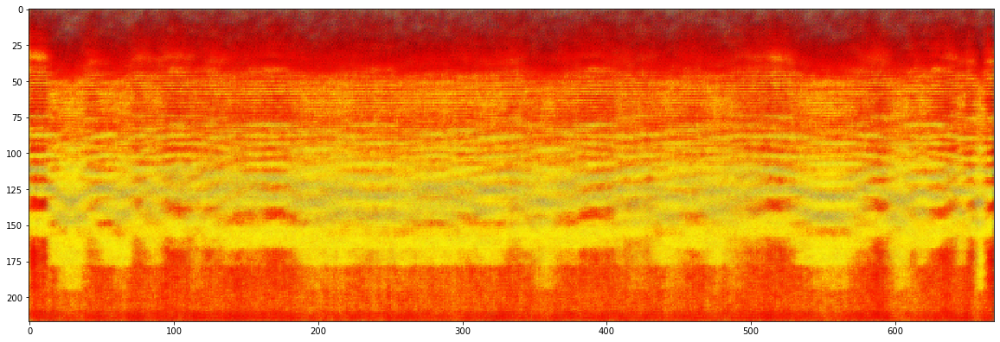

Epoch: [10/100], Step: [0], learning_rate: 0.001, loss: 674366.750000
Epoch: [10/100], Step: [5], learning_rate: 0.001, loss: 652727.000000
Epoch: [10/100], Step: [10], learning_rate: 0.001, loss: 641111.687500
Epoch: [10/100], Step: [15], learning_rate: 0.001, loss: 624231.937500
Avg loss on test dataset: 692745.1979166666


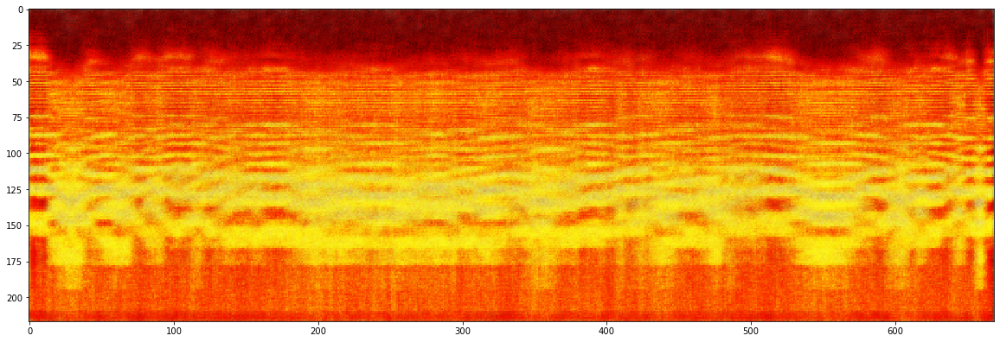

Epoch: [11/100], Step: [0], learning_rate: 0.001, loss: 620782.625000
Epoch: [11/100], Step: [5], learning_rate: 0.001, loss: 619028.375000
Epoch: [11/100], Step: [10], learning_rate: 0.001, loss: 607408.500000
Epoch: [11/100], Step: [15], learning_rate: 0.001, loss: 596677.125000
Avg loss on test dataset: 675365.1041666666


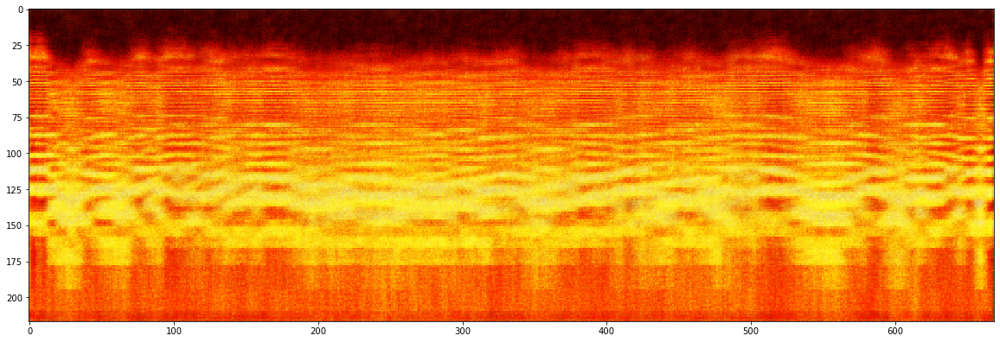

Epoch: [12/100], Step: [0], learning_rate: 0.001, loss: 596994.687500
Epoch: [12/100], Step: [5], learning_rate: 0.001, loss: 594297.437500
Epoch: [12/100], Step: [10], learning_rate: 0.001, loss: 587774.187500
Epoch: [12/100], Step: [15], learning_rate: 0.001, loss: 590047.625000
Avg loss on test dataset: 672143.53125


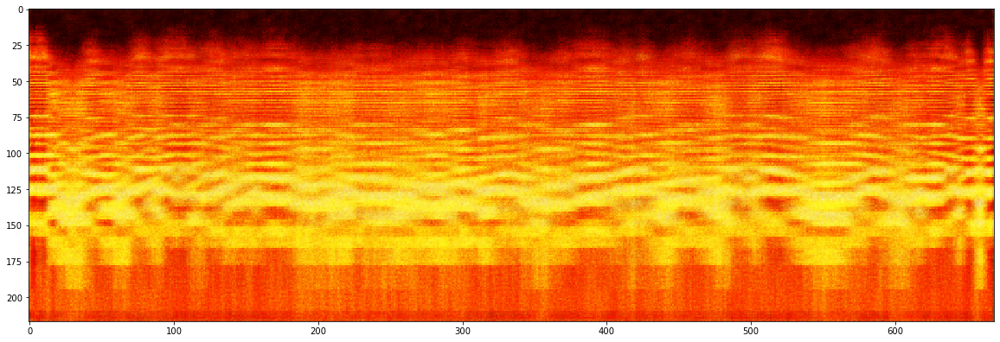

Epoch: [13/100], Step: [0], learning_rate: 0.001, loss: 584065.562500
Epoch: [13/100], Step: [5], learning_rate: 0.001, loss: 582806.187500
Epoch: [13/100], Step: [10], learning_rate: 0.001, loss: 583487.875000
Epoch: [13/100], Step: [15], learning_rate: 0.001, loss: 574953.750000
Avg loss on test dataset: 663485.3333333334


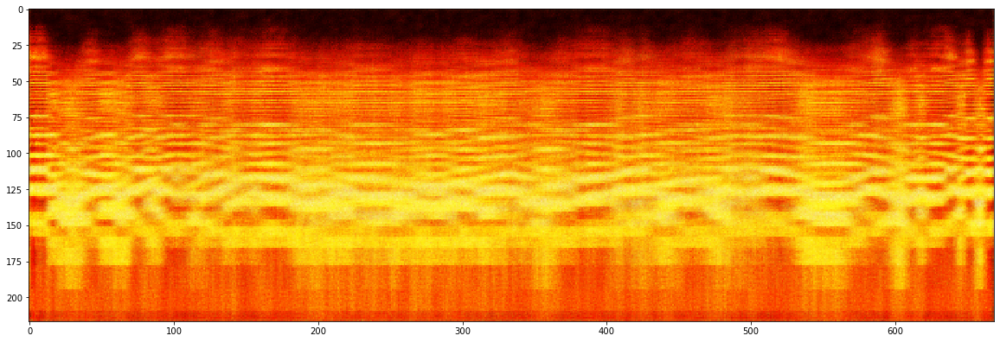

Epoch: [14/100], Step: [0], learning_rate: 0.001, loss: 580610.875000
Epoch: [14/100], Step: [5], learning_rate: 0.001, loss: 588003.625000
Epoch: [14/100], Step: [10], learning_rate: 0.001, loss: 583670.500000
Epoch: [14/100], Step: [15], learning_rate: 0.001, loss: 583165.437500
Avg loss on test dataset: 662278.6041666666


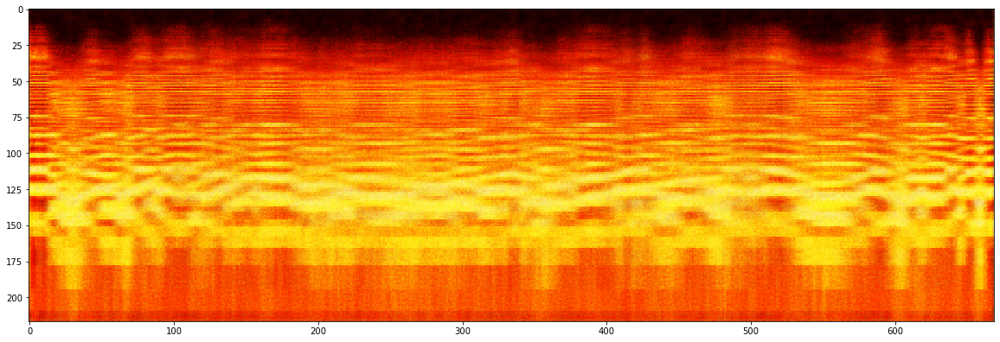

Epoch: [15/100], Step: [0], learning_rate: 0.001, loss: 578250.500000
Epoch: [15/100], Step: [5], learning_rate: 0.001, loss: 575700.062500
Epoch: [15/100], Step: [10], learning_rate: 0.001, loss: 575527.062500
Epoch: [15/100], Step: [15], learning_rate: 0.001, loss: 577782.500000
Avg loss on test dataset: 667701.6145833334


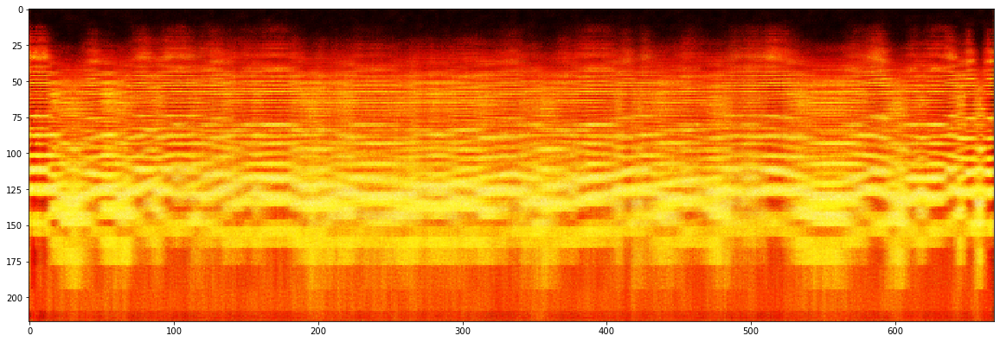

Epoch: [16/100], Step: [0], learning_rate: 0.001, loss: 573780.187500
Epoch: [16/100], Step: [5], learning_rate: 0.001, loss: 584321.625000
Epoch: [16/100], Step: [10], learning_rate: 0.001, loss: 574285.500000
Epoch: [16/100], Step: [15], learning_rate: 0.001, loss: 589033.687500
Avg loss on test dataset: 660413.96875


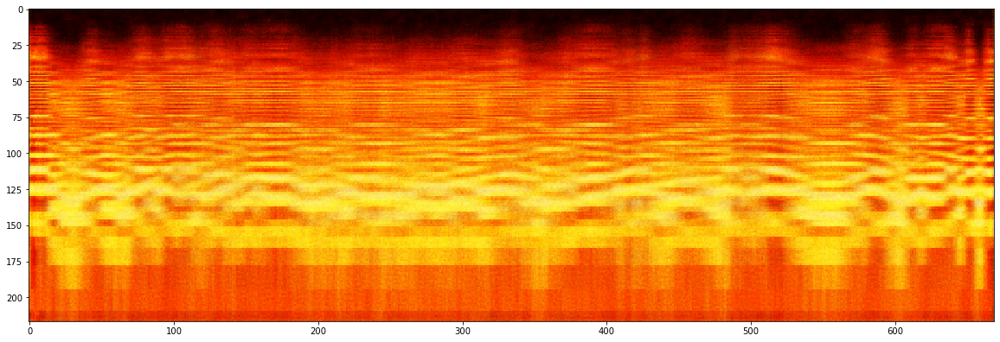

Epoch: [17/100], Step: [0], learning_rate: 0.001, loss: 575751.687500
Epoch: [17/100], Step: [5], learning_rate: 0.001, loss: 573193.187500
Epoch: [17/100], Step: [10], learning_rate: 0.001, loss: 580154.000000
Epoch: [17/100], Step: [15], learning_rate: 0.001, loss: 577417.312500
Avg loss on test dataset: 663588.4166666666


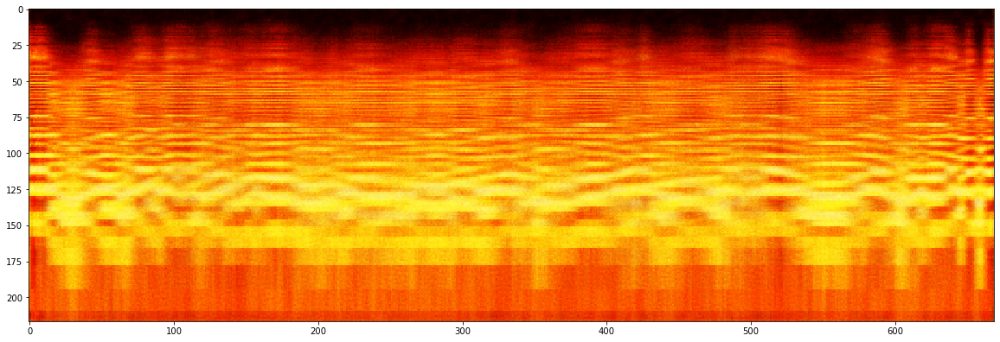

Epoch: [18/100], Step: [0], learning_rate: 0.001, loss: 571052.062500
Epoch: [18/100], Step: [5], learning_rate: 0.001, loss: 584032.500000
Epoch: [18/100], Step: [10], learning_rate: 0.001, loss: 577589.562500
Epoch: [18/100], Step: [15], learning_rate: 0.001, loss: 580100.937500
Avg loss on test dataset: 670049.4791666666


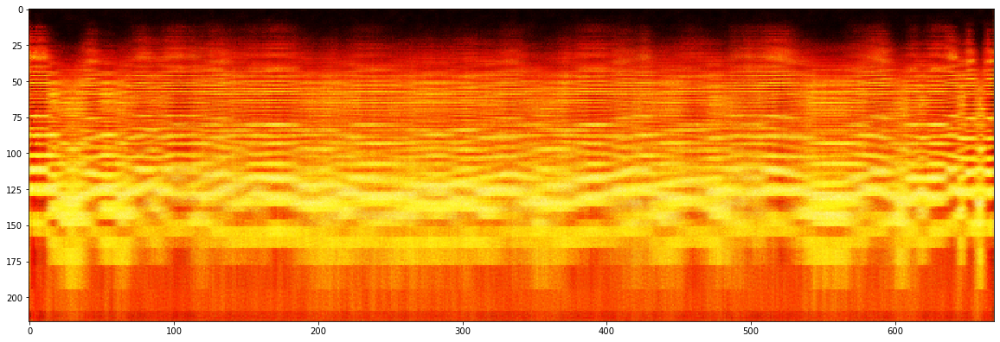

Epoch: [19/100], Step: [0], learning_rate: 0.001, loss: 572566.687500
Epoch: [19/100], Step: [5], learning_rate: 0.001, loss: 573479.500000
Epoch: [19/100], Step: [10], learning_rate: 0.001, loss: 569860.687500
Epoch: [19/100], Step: [15], learning_rate: 0.001, loss: 579640.437500
Avg loss on test dataset: 663760.0729166666


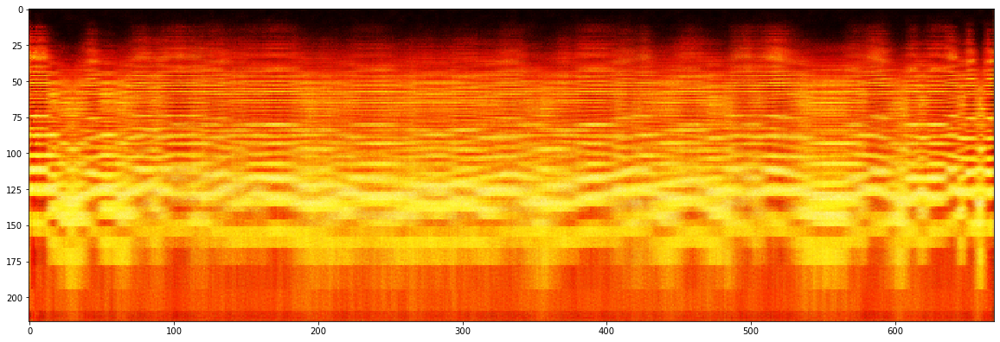

Epoch: [20/100], Step: [0], learning_rate: 0.001, loss: 574775.562500
Epoch: [20/100], Step: [5], learning_rate: 0.001, loss: 578896.125000
Epoch: [20/100], Step: [10], learning_rate: 0.001, loss: 569513.312500
Epoch: [20/100], Step: [15], learning_rate: 0.001, loss: 579042.187500
Avg loss on test dataset: 675677.9270833334


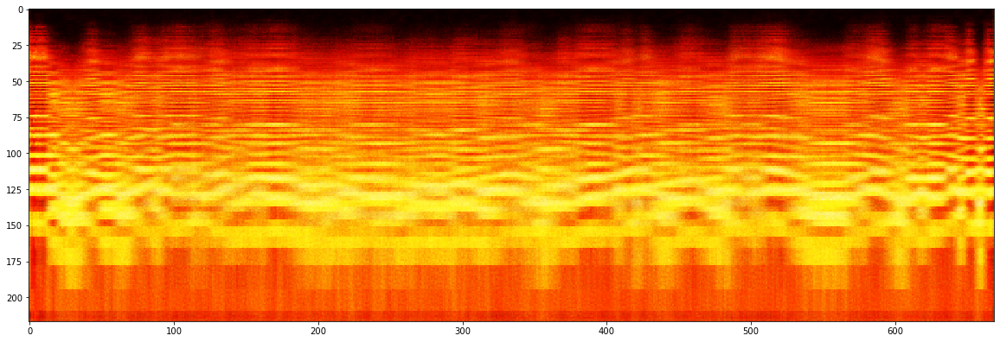

Epoch: [21/100], Step: [0], learning_rate: 0.001, loss: 576731.687500
Epoch: [21/100], Step: [5], learning_rate: 0.001, loss: 572443.375000
Epoch: [21/100], Step: [10], learning_rate: 0.001, loss: 576830.812500
Epoch: [21/100], Step: [15], learning_rate: 0.001, loss: 573255.000000
Avg loss on test dataset: 672691.4375


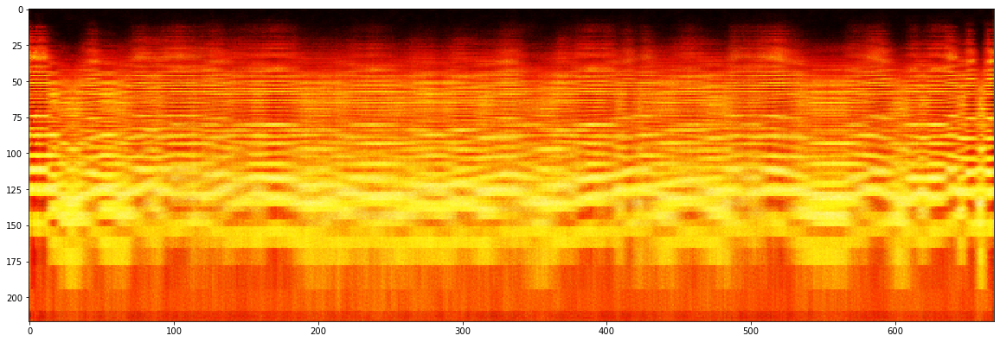

Epoch: [22/100], Step: [0], learning_rate: 0.001, loss: 597123.875000
Epoch: [22/100], Step: [5], learning_rate: 0.001, loss: 576419.062500
Epoch: [22/100], Step: [10], learning_rate: 0.001, loss: 573690.937500
Epoch: [22/100], Step: [15], learning_rate: 0.001, loss: 573701.250000
Avg loss on test dataset: 661196.6041666666


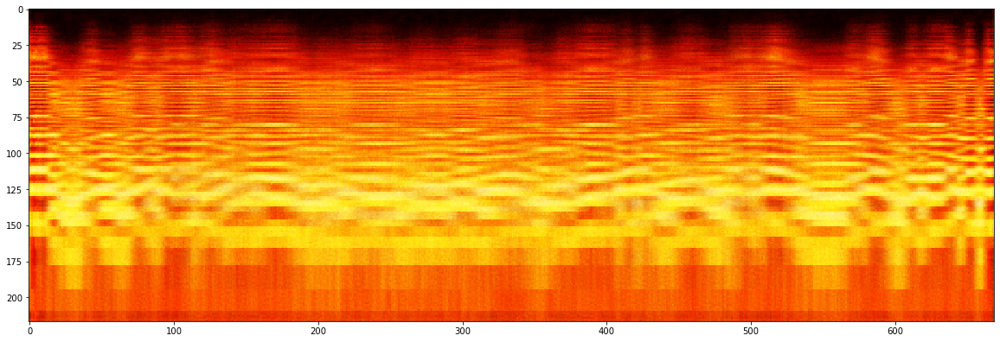

Epoch: [23/100], Step: [0], learning_rate: 0.001, loss: 574204.000000
Epoch: [23/100], Step: [5], learning_rate: 0.001, loss: 582400.000000
Epoch: [23/100], Step: [10], learning_rate: 0.001, loss: 577992.750000
Epoch: [23/100], Step: [15], learning_rate: 0.001, loss: 569991.687500
Avg loss on test dataset: 666677.59375


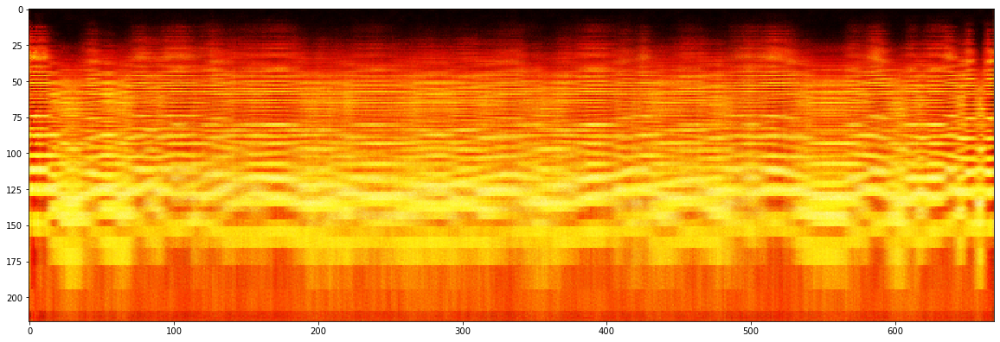

Epoch: [24/100], Step: [0], learning_rate: 0.001, loss: 574288.125000
Epoch: [24/100], Step: [5], learning_rate: 0.001, loss: 565275.625000
Epoch: [24/100], Step: [10], learning_rate: 0.001, loss: 583002.187500
Epoch: [24/100], Step: [15], learning_rate: 0.001, loss: 586842.437500
Avg loss on test dataset: 665916.5208333334


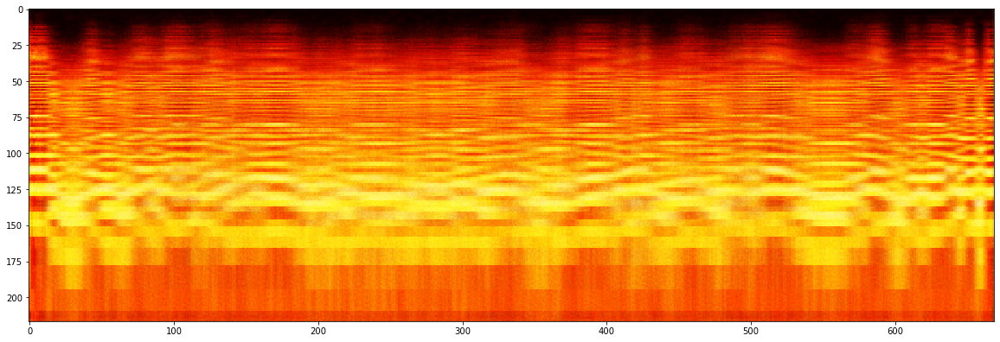

Epoch: [25/100], Step: [0], learning_rate: 0.001, loss: 564425.875000
Epoch: [25/100], Step: [5], learning_rate: 0.001, loss: 570998.500000
Epoch: [25/100], Step: [10], learning_rate: 0.001, loss: 572333.562500
Epoch: [25/100], Step: [15], learning_rate: 0.001, loss: 563838.000000
Avg loss on test dataset: 668253.9479166666


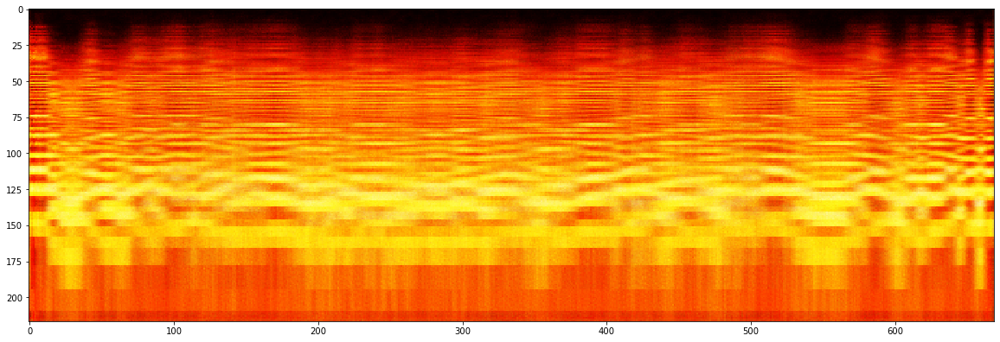

Epoch: [26/100], Step: [0], learning_rate: 0.001, loss: 565821.750000
Epoch: [26/100], Step: [5], learning_rate: 0.001, loss: 577673.875000
Epoch: [26/100], Step: [10], learning_rate: 0.001, loss: 574692.125000
Epoch: [26/100], Step: [15], learning_rate: 0.001, loss: 578380.312500
Avg loss on test dataset: 673958.1770833334


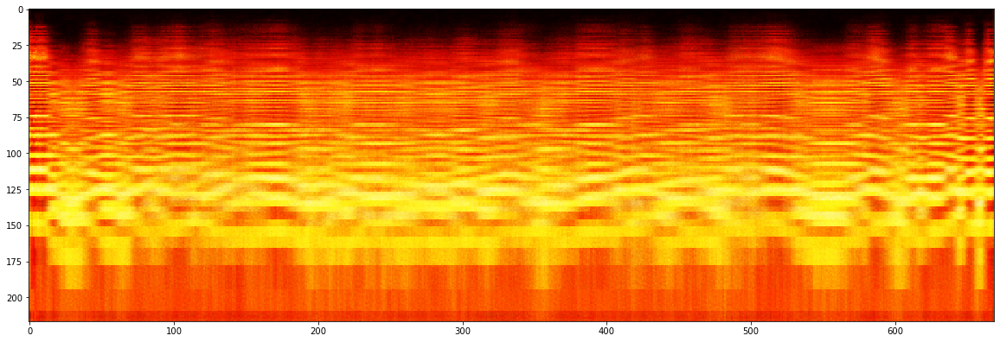

Epoch: [27/100], Step: [0], learning_rate: 0.001, loss: 566246.750000
Epoch: [27/100], Step: [5], learning_rate: 0.001, loss: 565666.687500
Epoch: [27/100], Step: [10], learning_rate: 0.001, loss: 584906.437500
Epoch: [27/100], Step: [15], learning_rate: 0.001, loss: 572278.937500
Avg loss on test dataset: 670885.2083333334


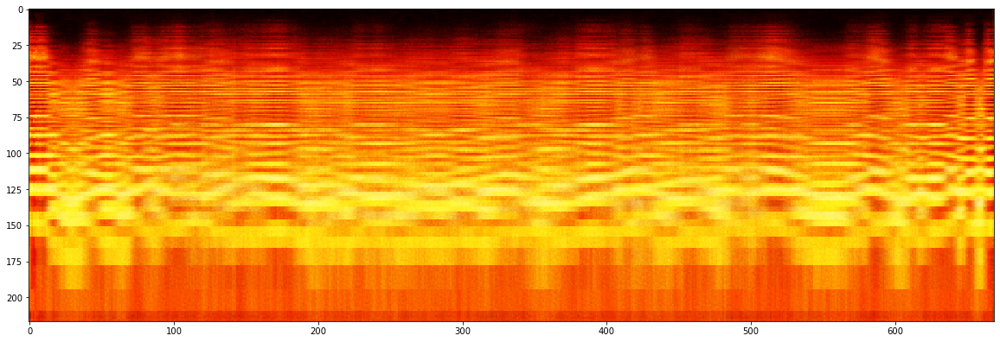

Epoch: [28/100], Step: [0], learning_rate: 0.001, loss: 570795.062500
Epoch: [28/100], Step: [5], learning_rate: 0.001, loss: 573922.187500
Epoch: [28/100], Step: [10], learning_rate: 0.001, loss: 576268.750000
Epoch: [28/100], Step: [15], learning_rate: 0.001, loss: 561052.375000
Avg loss on test dataset: 664644.6875


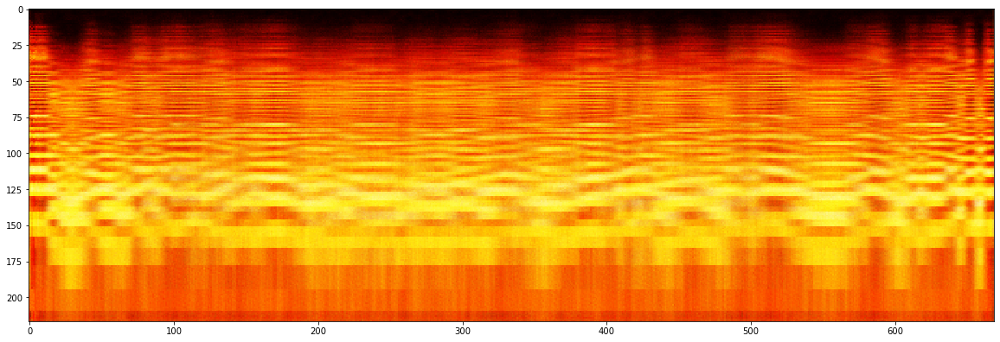

Epoch: [29/100], Step: [0], learning_rate: 0.001, loss: 576928.625000
Epoch: [29/100], Step: [5], learning_rate: 0.001, loss: 582756.500000
Epoch: [29/100], Step: [10], learning_rate: 0.001, loss: 569267.562500
Epoch: [29/100], Step: [15], learning_rate: 0.001, loss: 576776.000000
Avg loss on test dataset: 668652.6770833334


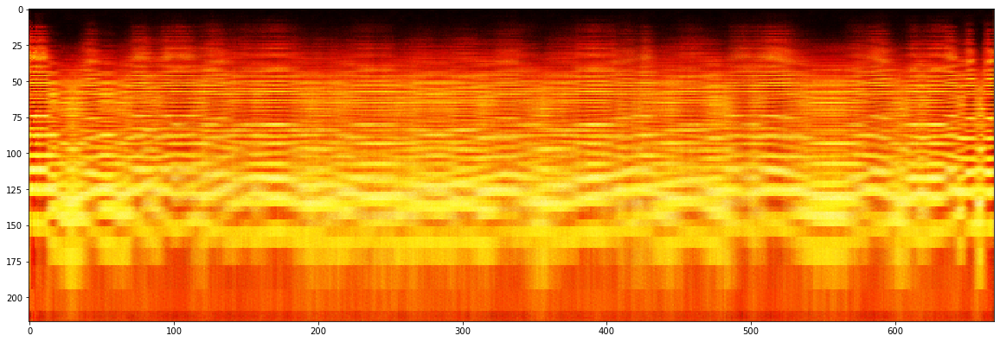

Epoch: [30/100], Step: [0], learning_rate: 0.001, loss: 561309.875000
Epoch: [30/100], Step: [5], learning_rate: 0.001, loss: 571754.687500
Epoch: [30/100], Step: [10], learning_rate: 0.001, loss: 570427.312500
Epoch: [30/100], Step: [15], learning_rate: 0.001, loss: 568518.750000
Avg loss on test dataset: 674173.0104166666


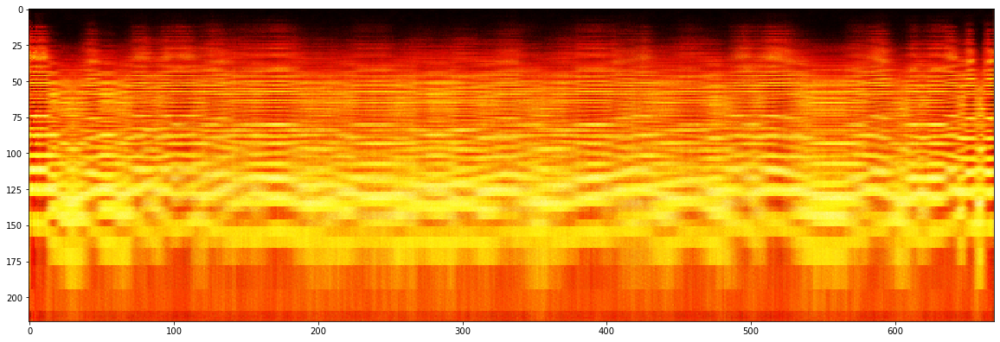

Epoch: [31/100], Step: [0], learning_rate: 0.001, loss: 582965.062500
Epoch: [31/100], Step: [5], learning_rate: 0.001, loss: 569264.750000
Epoch: [31/100], Step: [10], learning_rate: 0.001, loss: 577225.562500
Epoch: [31/100], Step: [15], learning_rate: 0.001, loss: 573661.687500
Avg loss on test dataset: 664181.0833333334


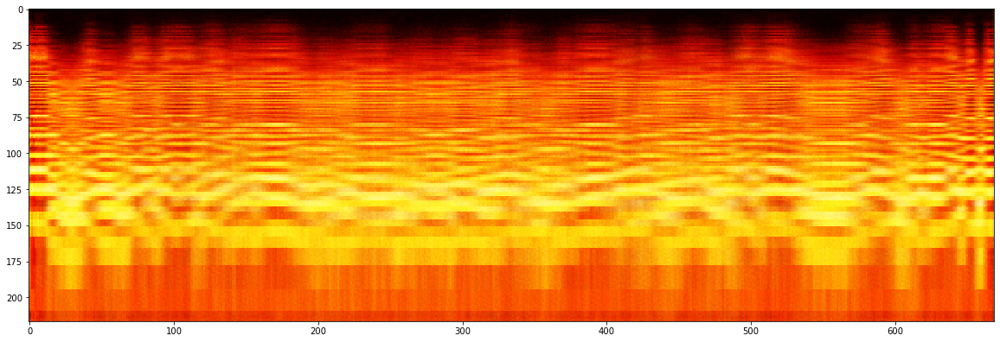

Epoch: [32/100], Step: [0], learning_rate: 0.001, loss: 569946.000000
Epoch: [32/100], Step: [5], learning_rate: 0.001, loss: 569781.125000
Epoch: [32/100], Step: [10], learning_rate: 0.001, loss: 558474.625000
Epoch: [32/100], Step: [15], learning_rate: 0.001, loss: 578465.250000
Avg loss on test dataset: 662813.625


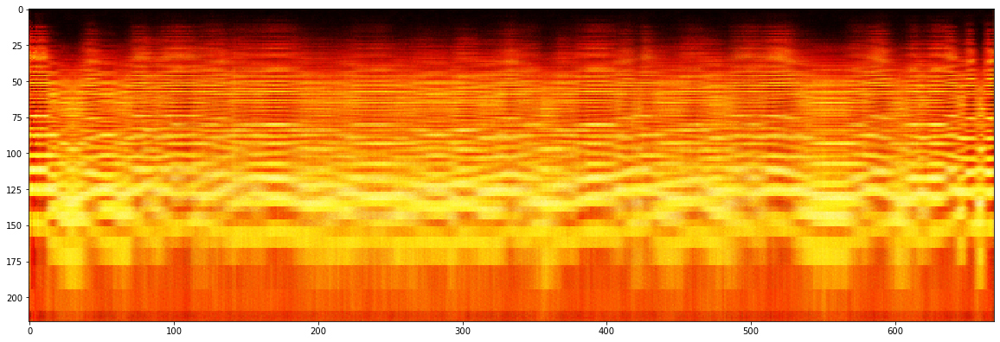

Epoch: [33/100], Step: [0], learning_rate: 0.001, loss: 568566.250000
Epoch: [33/100], Step: [5], learning_rate: 0.001, loss: 566434.250000
Epoch: [33/100], Step: [10], learning_rate: 0.001, loss: 568884.312500
Epoch: [33/100], Step: [15], learning_rate: 0.001, loss: 562683.125000
Avg loss on test dataset: 657017.53125


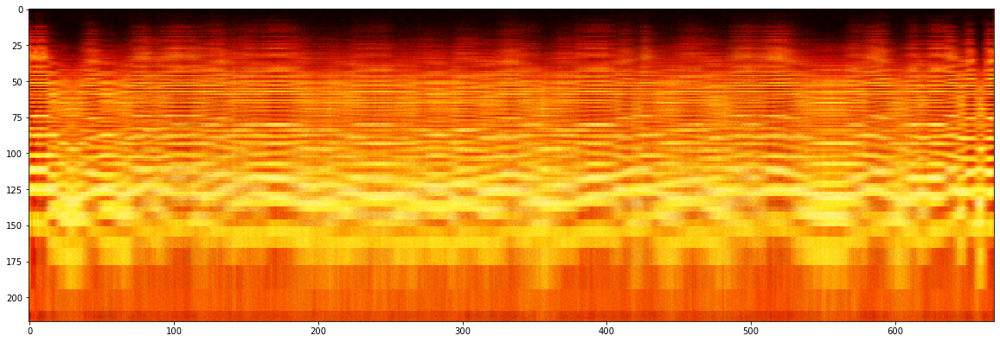

Epoch: [34/100], Step: [0], learning_rate: 0.001, loss: 567372.687500
Epoch: [34/100], Step: [5], learning_rate: 0.001, loss: 569264.187500
Epoch: [34/100], Step: [10], learning_rate: 0.001, loss: 572289.500000
Epoch: [34/100], Step: [15], learning_rate: 0.001, loss: 569174.125000
Avg loss on test dataset: 669741.1875


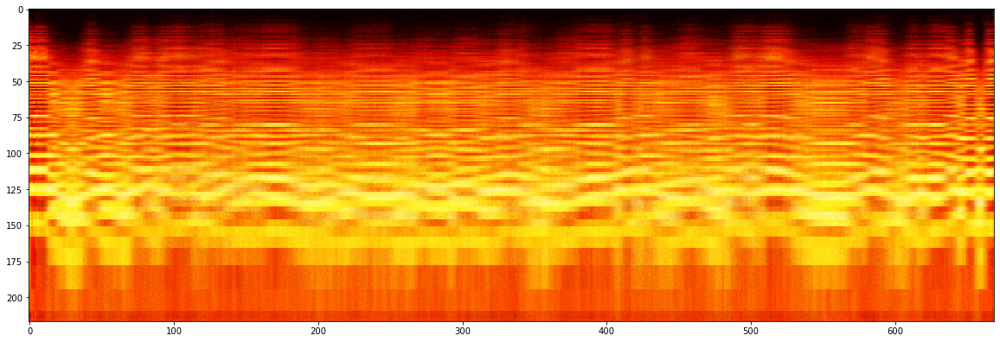

Epoch: [35/100], Step: [0], learning_rate: 0.001, loss: 571486.562500
Epoch: [35/100], Step: [5], learning_rate: 0.001, loss: 575460.937500
Epoch: [35/100], Step: [10], learning_rate: 0.001, loss: 562135.062500
Epoch: [35/100], Step: [15], learning_rate: 0.001, loss: 586507.875000
Avg loss on test dataset: 663612.875


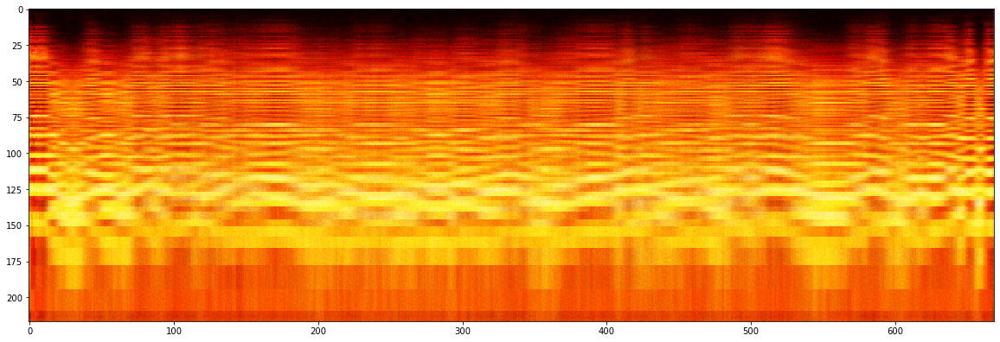

Epoch: [36/100], Step: [0], learning_rate: 0.001, loss: 567243.687500
Epoch: [36/100], Step: [5], learning_rate: 0.001, loss: 578674.437500
Epoch: [36/100], Step: [10], learning_rate: 0.001, loss: 566744.937500
Epoch: [36/100], Step: [15], learning_rate: 0.001, loss: 563941.812500
Avg loss on test dataset: 662715.8333333334


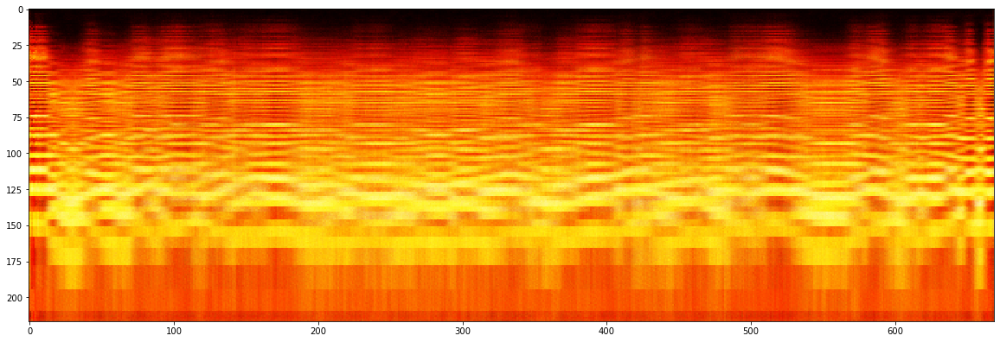

Epoch: [37/100], Step: [0], learning_rate: 0.001, loss: 567805.187500
Epoch: [37/100], Step: [5], learning_rate: 0.001, loss: 565723.437500
Epoch: [37/100], Step: [10], learning_rate: 0.001, loss: 572042.625000
Epoch: [37/100], Step: [15], learning_rate: 0.001, loss: 569726.312500
Avg loss on test dataset: 666328.625


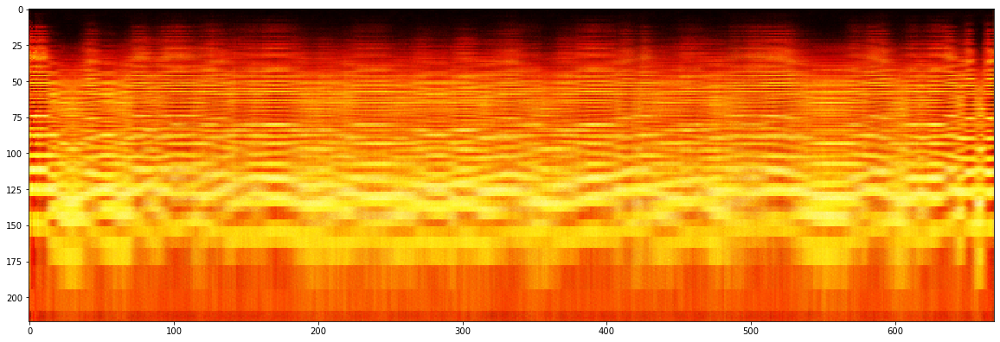

Epoch: [38/100], Step: [0], learning_rate: 0.001, loss: 573010.687500
Epoch: [38/100], Step: [5], learning_rate: 0.001, loss: 573581.187500
Epoch: [38/100], Step: [10], learning_rate: 0.001, loss: 572056.375000
Epoch: [38/100], Step: [15], learning_rate: 0.001, loss: 563106.062500
Avg loss on test dataset: 670183.6770833334


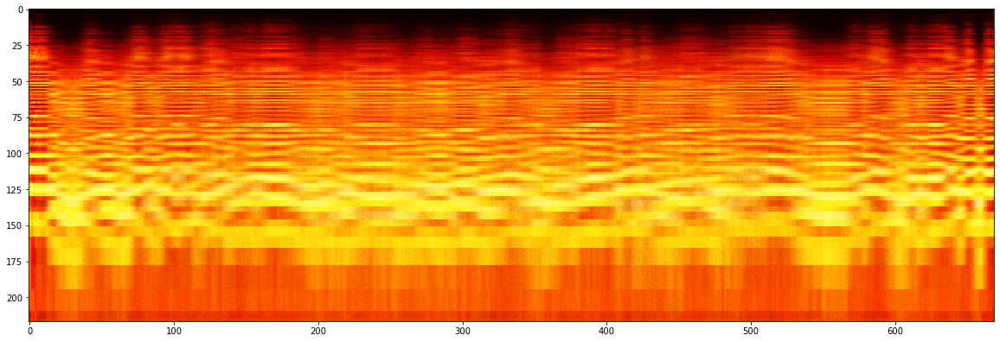

Epoch: [39/100], Step: [0], learning_rate: 0.001, loss: 568128.500000
Epoch: [39/100], Step: [5], learning_rate: 0.001, loss: 565009.500000
Epoch: [39/100], Step: [10], learning_rate: 0.001, loss: 586952.625000
Epoch: [39/100], Step: [15], learning_rate: 0.001, loss: 573746.437500
Avg loss on test dataset: 665416.1770833334


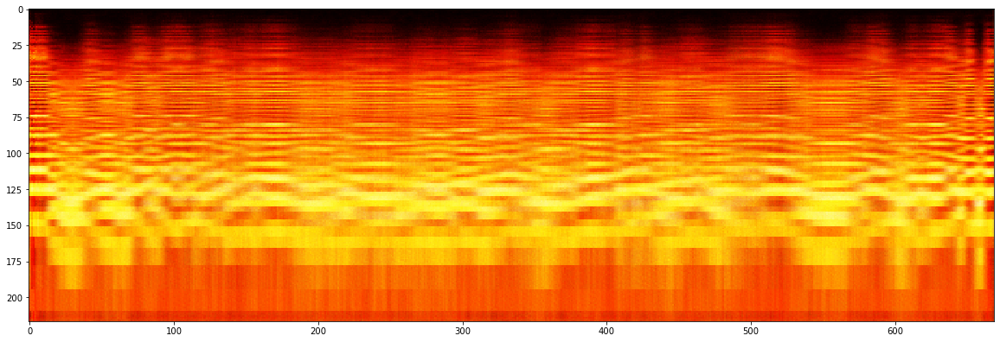

Epoch: [40/100], Step: [0], learning_rate: 0.001, loss: 565732.562500
Epoch: [40/100], Step: [5], learning_rate: 0.001, loss: 565178.062500
Epoch: [40/100], Step: [10], learning_rate: 0.001, loss: 564451.375000
Epoch: [40/100], Step: [15], learning_rate: 0.001, loss: 571029.750000


ValueError: too many values to unpack (expected 2)

In [ ]:
epochs = 100
lr = 0.001

device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # torch.device("cpu") 

net = Model(hidden_dim=16, latent_size=5, batch_size=batch_size, img_size=(217,669))

net.to(device)

optimizer = torch.optim.Adam(net.parameters(), lr=lr)

# net.to(device)
net.cuda()

cur_loss = 0
best_loss = float('inf')

debug = False

print("Training start!")

for epoch in range(1, epochs+1):
    net.train()

    for i, batch in enumerate(train_loader):

        x, y = batch[0].to(device), batch[1].to(device)

        net.zero_grad()

        mean, logvar, y_hat = net.forward(x)#.transpose(1,2)
        if debug:
            print("y max", torch.max(y), " y min", torch.min(y))
            print("y nan", (torch.sum(torch.isnan(y)) > 0))
            print("y hat max", torch.max(y_hat), " y hat min", torch.min(y_hat))
            print("y hat nan", (torch.sum(torch.isnan(y_hat)) > 0))

        loss = compute_loss(y, y_hat, mean, logvar)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if i == 0:
            imshow(y_hat[0].cpu().detach())

        if i % 5 == 0:
            print('Epoch: [{}/{}], Step: [{}], '
                'learning_rate: {}, '
                'loss: {:4f}'
                .format(epoch, epochs, i, lr, loss.item()))
            
    
    print(f'Avg loss on test dataset: {evaluate(net, test_loader)}')


print('Training Done!')

## Invert Spectrogram

In [ ]:
def wav_to_spec(wav_path):
    x, sr = librosa.load(wav_path, sr=None)
    window_size = 1024
    hop_length = 512
    n_mels = 128
    time_steps = 384
    window = np.hanning(window_size)
    stft = librosa.core.spectrum.stft(x, n_fft = window_size, hop_length = hop_length, window = window)
    out = 2 * np.abs(stft) / np.sum(window)
    print("spec",np.var(stft))
    return stft

def spec_to_wav(stft, wav_path):

    window_size = 1024
    hop_length = 512
    n_mels = 128
    time_steps = 384
    sample_rate = 44100
    window = np.hanning(window_size)
    istft = librosa.core.istft(stft, win_length = window_size, hop_length = hop_length, window = 'hann')
    print("ispec", np.var(istft))
    rounded_reconstructed = istft # np.rint(istft).astype(np.int16)
    print("recon",np.var(rounded_reconstructed))
    test_file = os.path.join(wav_path, 'inverted.wav')
    wavfile.write(test_file, sample_rate, rounded_reconstructed)
    
    

In [ ]:
audio_in_path = r"C:\Users\u\Projects\acoustic_to_electric\data_generation\inverted_spectrogram_tests\acoustic_test_track_00.mid.wav"
audio_out_path = r"C:\Users\u\Projects\acoustic_to_electric\data_generation\inverted_spectrogram_tests\inverted.wav"
spec_in_path = r"C:\Users\u\Projects\acoustic_to_electric\data_generation\inverted_spectrogram_tests\spectrogram_generated.png"
# spec_to_wav(wav_to_spec(audio_in_path), audio_out_path)

In [ ]:
_hop_length=2048

data, sampleRate = librosa.core.load(audio_in_path, sr=44100, mono=True)

img = np.array(img, dtype=float)/np.array(ImageOps.grayscale(Image.open(spec_in_path)))
# img = np.linalg.norm(img)
# stftMat = librosa.core.stft(img, n_fft=_n_fft, hop_length=_hop_length, center=True)
iStftMat = librosa.core.istft(img, hop_length=_hop_length)

wavfile.write(audio_out_path, 44100, iStftMat)

powerMat = np.abs(stftMat)
print("powerMat shape = " + str(powerMat.shape))

powerMat shape = (41, 99661)
